# Finite-Time Lyapunov Exponent (FTLE) with Continuous Velocity Field
We present two examples where the FTLE is calculated from known continuous velocity fields as opposed to discrete fields specified at grid points.
The first example demonstrates a simple FTLE analysis and lays the conceptual foundation for later analysis on discrete data. The second example showcases an issue of sliding-window FTLE analysis.

In [1]:
using ILMPostProcessing
using ImmersedLayers
using Plots

## Example 1: Unsteady Double Gyre
This example replicates the time-dependent double gyre from Shadden 2005. The double gyre velocity field's specification can be found at https://shaddenlab.berkeley.edu/uploads/LCS-tutorial/examples.html#Sec7.1. The results in this simulation is highly similar.
### Generate Initial Conditions for the IVP

In [2]:
X_MIN, X_MAX = 0.0, 2.0
Y_MIN, Y_MAX = 0.0, 1.0
dx = 0.002

ftlegrid = PhysicalGrid((X_MIN,X_MAX),(Y_MIN,Y_MAX),dx,optimize=false);
ftle_cache = SurfaceScalarCache(ftlegrid)
x0, y0 = x_grid(ftle_cache), y_grid(ftle_cache)

(CartesianGrids.Primal nodes in a (nx = 1002, ny = 502) cell grid of type Float64 data
  Number of CartesianGrids.Primal nodes: (nx = 1001, ny = 501), CartesianGrids.Primal nodes in a (nx = 1002, ny = 502) cell grid of type Float64 data
  Number of CartesianGrids.Primal nodes: (nx = 1001, ny = 501))

### Define the Double Gyre's Vector Field

In [3]:
A = 0.1
epsilon = 0.25
omega = 2 * π / 10

a(s) = epsilon * sin(omega * s)
b(s) = 1 - 2 * epsilon * sin(omega * s)
f(x, t) = a(t) * x^2 + b(t) * x
dfdx(x, t) = 2 * a(t) * x + b(t)

u(x,y,t) = -π * A * sin.(π * f(x, t)) .* cos.(π * y)
v(x,y,t) = π * A * cos.(π * f(x, t)) .* sin.(π * y) .* dfdx(x, t)

v (generic function with 1 method)

### Solve the Forward and Backward IVPs

In [4]:
t0 = 0.0
T = 12
xf, yf = displacement_field(u,v,x0,y0,(t0,t0+T))
xb, yb = displacement_field(u,v,x0,y0,(t0,t0-T))

(CartesianGrids.Primal nodes in a (nx = 1002, ny = 502) cell grid of type Float64 data
  Number of CartesianGrids.Primal nodes: (nx = 1001, ny = 501), CartesianGrids.Primal nodes in a (nx = 1002, ny = 502) cell grid of type Float64 data
  Number of CartesianGrids.Primal nodes: (nx = 1001, ny = 501))

### Compute the Forward and Backward FTLEs

In [5]:
fFTLE = similar(x0)
bFTLE = similar(x0)
compute_FTLE!(fFTLE,xf,yf,dx,dx,T)
compute_FTLE!(bFTLE,xb,yb,dx,dx,T)

999×499 view(::CartesianGrids.Nodes{CartesianGrids.Primal, 1002, 502, Float64, Matrix{Float64}}, 2:1000, 2:500) with eltype Float64:
 0.448584  0.449056  0.449811  0.450805  …  0.268316  0.21546   0.460101
 0.292874  0.329463  0.354259  0.370953     0.292177  0.252408  0.460145
 0.344975  0.36352   0.375025  0.380836     0.311799  0.279575  0.460216
 0.380077  0.378476  0.372825  0.367269     0.326141  0.29958   0.460314
 0.402643  0.380143  0.361144  0.352896     0.336477  0.314867  0.460436
 0.416658  0.376209  0.354117  0.347475  …  0.343955  0.326907  0.460581
 0.425557  0.373205  0.352851  0.343371     0.349392  0.336608  0.460746
 0.431679  0.373181  0.352031  0.337131     0.353348  0.344563  0.460929
 0.436321  0.374701  0.349538  0.32932      0.356208  0.351176  0.461128
 0.440105  0.376053  0.3455    0.32087      0.358243  0.356737  0.461339
 ⋮                                       ⋱                      
 0.293291  0.29348   0.293468  0.292994  …  0.316999  0.282505  0.460162

### Plot the FTLEs on Top of Each Other

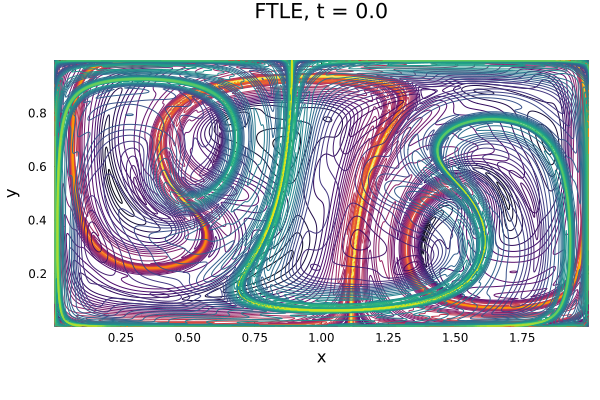

In [6]:
plot(fFTLE, ftle_cache,fill=false, title="FTLE, t = $t0", xlabel="x", ylabel="y", colorbar=false, levels = 30, c=:inferno)
plot!(bFTLE, ftle_cache, fill=false, colorbar=false, levels = 30, c=:viridis)

The code here creates a gif

    fFTLE = similar(x0)
    bFTLE = similar(x0)

    @gif for t0 in 0.0:1.0:10.0
        print(t0)

        xf, yf = displacement_field(u,v,x0,y0,(t0,t0+T))
        xb, yb = displacement_field(u,v,x0,y0,(t0,t0-T))

        compute_FTLE!(fFTLE,xf,yf,dx,dx,T)
        compute_FTLE!(bFTLE,xb,yb,dx,dx,T)

        plot(fFTLE, ftle_cache,fill=false, title="FTLE, t = $t0", xlabel="x", ylabel="y", colorbar=false, levels = 30, c=:inferno)
        plot!(bFTLE, ftle_cache, fill=false, colorbar=false, levels = 30, c=:viridis)

    end every 1 fps = 2

## Example 2 - Issues with the Sliding-Window Approach
The sliding-window approach attempts to detect Langragian coherent structures (LCS) by computing the FTLE fields over windows of the form [t0, t0 + T] with varying t0 values. However, this approach does not obey Lagrangian invariance because the LCS's at different t0 values do not evolve into each other (Haller 2015).

This example illustrates the point above.

### First, generate initial conditions.

In [7]:
X_MIN, X_MAX = -6.0, 50.0
Y_MIN, Y_MAX = -2, 2
dx = 0.08

ftlegrid = PhysicalGrid((X_MIN,X_MAX),(Y_MIN,Y_MAX),dx,optimize=false);
ftle_cache = SurfaceScalarCache(ftlegrid)
x0, y0 = x_grid(ftle_cache), y_grid(ftle_cache)

(CartesianGrids.Primal nodes in a (nx = 702, ny = 52) cell grid of type Float64 data
  Number of CartesianGrids.Primal nodes: (nx = 701, ny = 51), CartesianGrids.Primal nodes in a (nx = 702, ny = 52) cell grid of type Float64 data
  Number of CartesianGrids.Primal nodes: (nx = 701, ny = 51))

### Define the Vector Field

In [8]:
u2(x,y) = 1 + tanh.(x).^2
v2(x,y) = -2 * tanh.(x) ./ cosh.(x).^2 .* y

v2 (generic function with 1 method)

### Solve the IVP and Compute FTLEs with the Sliding-Window Approach
As shown in the figure,although the flow is unsteady, the actual LCS is a material line that moves with the flow to the right. Nevertheless, as shown in the gif below, when t0 varies from 0.0 to 10.0, the forward FTLE fields reveals a repelling LCS fixed on the y-axis.

![Lack of Lagrangian Invariance](https://github.com/qiyuanbillwu/ILMPostProcessing.jl/raw/master/Lagrangian_Invariance.png)

0.00.51.01.52.02.53.03.54.04.55.05.56.06.57.07.58.08.59.09.510.0[ Info: Saved animation to /var/folders/d5/yrzwk1z11mjcdnl51v1kfp8m0000gn/T/jl_GnSvwzmFGn.gif


Plots.AnimatedGif("/var/folders/d5/yrzwk1z11mjcdnl51v1kfp8m0000gn/T/jl_GnSvwzmFGn.gif")
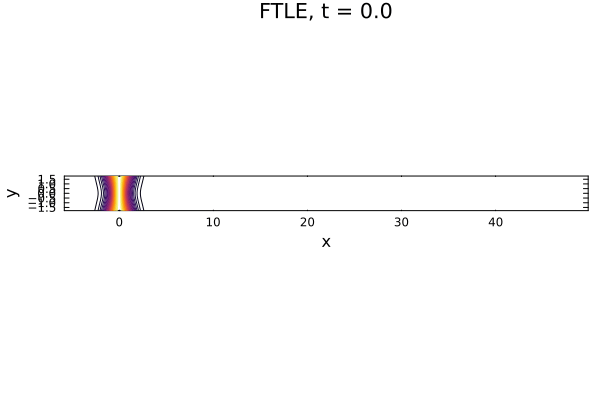

In [9]:
fFTLE = similar(x0)
T = 5

@gif for t0 in 0.0:0.5:10.0
    print(t0)

    xf, yf = displacement_field(u2,v2,x0,y0,(t0,t0+T))
    compute_FTLE!(fFTLE,xf,yf,dx,dx,T)

    plot(fFTLE, ftle_cache,fill=false, title="FTLE, t = $t0", xlabel="x", ylabel="y", colorbar=false, levels = 30, c=:inferno)

end every 1 fps = 2

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*